<a href="https://colab.research.google.com/github/VixZ-Z/Python-ML/blob/main/Definitivo_HorsesVSHumans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
datos,metadatos = tfds.load('horses_or_humans',as_supervised = True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

In [ ]:
Dtraindata = datos['train']
testdata = datos['test']

In [ ]:
def normalizar(imagenes, etiquetas):
  imagenes = tf.cast(imagenes, tf.float32)
  imagenes /= 255.0 #Aqui se pasa de 0-255 a 0-1
  return imagenes, etiquetas

#Normalizar los datos de entrenamiento con la funcion que hicimos
Dtraindata = Dtraindata.map(normalizar)
testdata = testdata.map(normalizar)


In [ ]:
#Preparamos los datos antes de imporimir y operar
import cv2
traindata = []
x = []
y = []
TAMANO_IMG=100
for i, (imagen, etiqueta) in enumerate(datos['train']): #Todos los datos
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1) #Cambiar tamano a 100,100,1
  x.append(imagen)
  y.append(etiqueta)
  traindata.append([imagen, etiqueta])



In [ ]:
y = np.array(y)
x = np.array(x).astype(float) / 255

In [ ]:
x

array([[[[0.18039216],
         [0.12156863],
         [0.22352941],
         ...,
         [0.10196078],
         [0.09411765],
         [0.06666667]],

        [[0.19215686],
         [0.08627451],
         [0.15686275],
         ...,
         [0.08627451],
         [0.07058824],
         [0.05882353]],

        [[0.23921569],
         [0.16078431],
         [0.2       ],
         ...,
         [0.10196078],
         [0.0627451 ],
         [0.04705882]],

        ...,

        [[0.44705882],
         [0.28627451],
         [0.44313725],
         ...,
         [0.09411765],
         [0.12941176],
         [0.4627451 ]],

        [[0.49019608],
         [0.35686275],
         [0.32941176],
         ...,
         [0.11764706],
         [0.49803922],
         [0.50980392]],

        [[0.51372549],
         [0.49411765],
         [0.39607843],
         ...,
         [0.35294118],
         [0.50980392],
         [0.51372549]]],


       [[[0.8627451 ],
         [0.86666667],
         [0.85

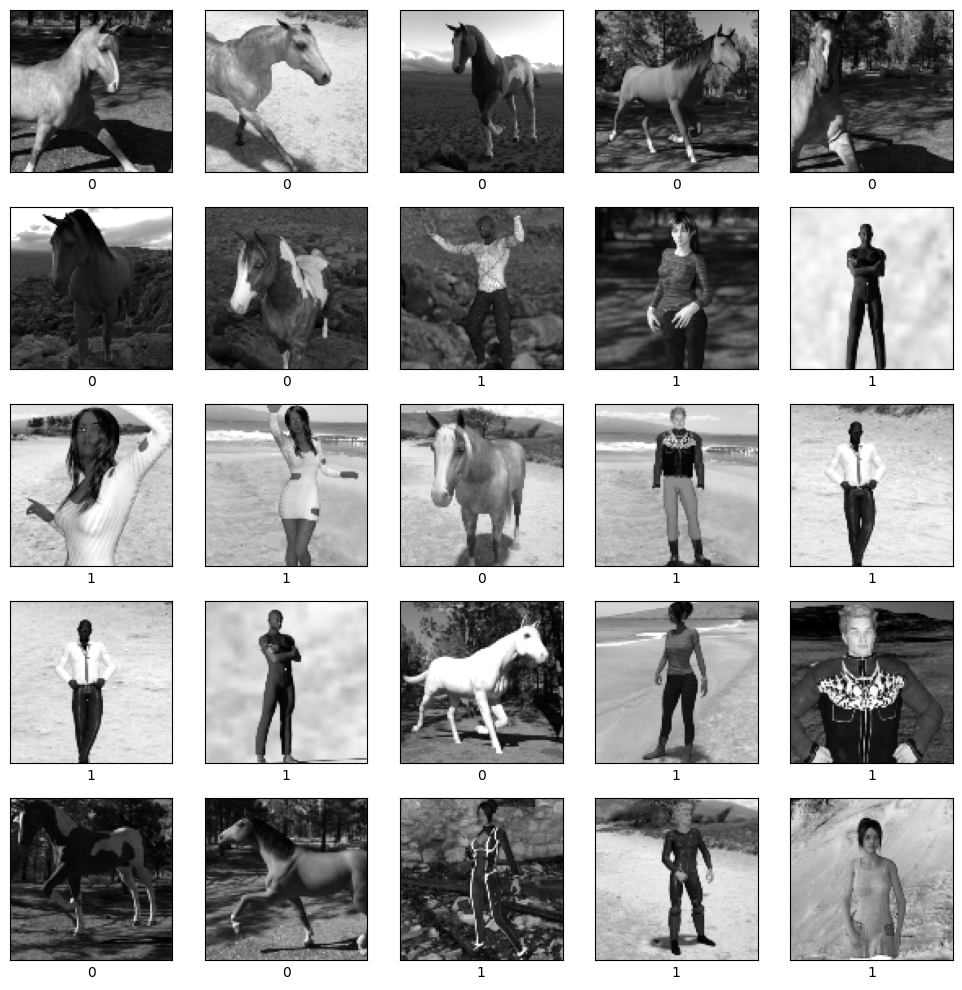

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
  plt.subplot(5,5,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.xlabel(y[i])
  plt.tight_layout()
  plt.imshow(x[i],cmap='gray')

In [ ]:
from tensorflow.keras.initializers import HeNormal
modelo = tf.keras.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer=HeNormal(),input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.8),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [ ]:
modelo.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

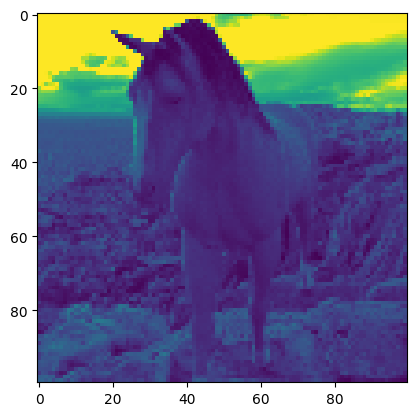

In [ ]:
plt.imshow(x[5])

In [ ]:
from tensorflow.keras.callbacks import TensorBoard
tensorboard = TensorBoard(log_dir='logs/cnn2')
modelo.fit(x, y, batch_size=32, validation_split=0.2, epochs=3, callbacks=[tensorboard])

Epoch 1/3
26/26 [==============================] - 17s 583ms/step - loss: 1.0071 - accuracy: 0.5579 - val_loss: 0.5912 - val_accuracy: 0.8738
Epoch 2/3
26/26 [==============================] - 14s 540ms/step - loss: 0.3918 - accuracy: 0.8307 - val_loss: 0.2334 - val_accuracy: 0.9078
Epoch 3/3
26/26 [==============================] - 15s 562ms/step - loss: 0.2435 - accuracy: 0.9160 - val_loss: 0.1451 - val_accuracy: 0.9466


In [ ]:
from tensorflow.keras.preprocessing import image
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(100, 100), color_mode='grayscale')
    img_array = image.img_to_array(img)
    img_array = img_array / 255.0  # Normalizar la imagen
    img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión para el batch
    return img_array


image_path = '/content/person22.jpg'


foto = preprocess_image(image_path)

# Realizar la predicción
prediction = modelo.predict(foto)

# Mostrar la predicción
print(f'Model prediction: {prediction[0][0]}')
if prediction[0][0] < 0.5:
    print('Predicted class: Caballo')
else:
    print('Predicted class: Humano')

1/1 [==============================] - 0s 52ms/step
Model prediction: 0.6746745109558105
Predicted class: Humano


In [ ]:
#Cargar la extension de tensorboard de colab
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
#Ejecutar tensorboard e indicarle que lea la carpeta "logs"
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

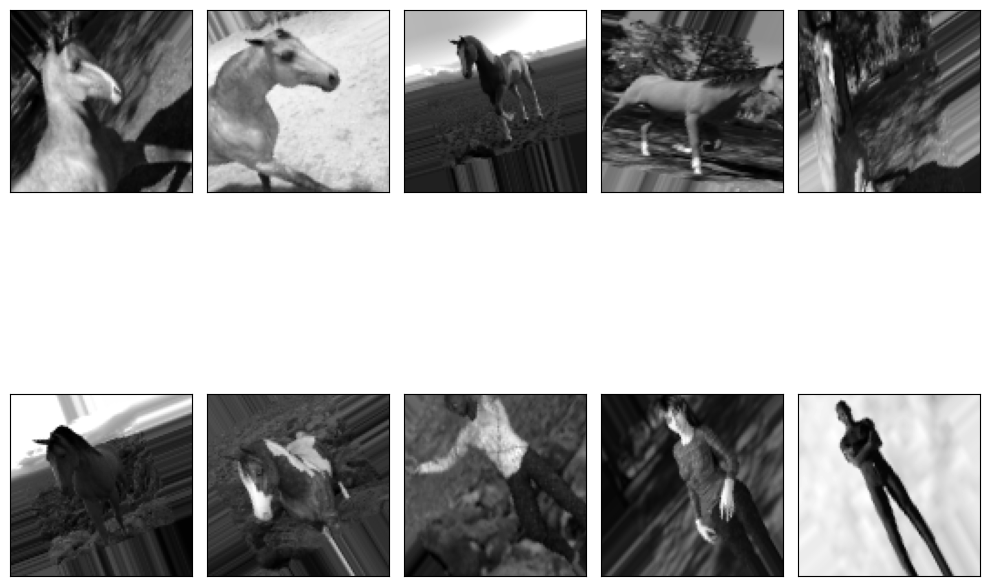

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=50,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=[0.7,1.4]
)

datagen.fit(x)
plt.figure(figsize=(10,10))
#Ya nos devuelve un batch de 10, asi que no hace falta iterar
for (foto, etq) in datagen.flow(x,y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(foto[i].reshape(100,100), cmap='gray')

  plt.tight_layout()
  plt.show()
  break


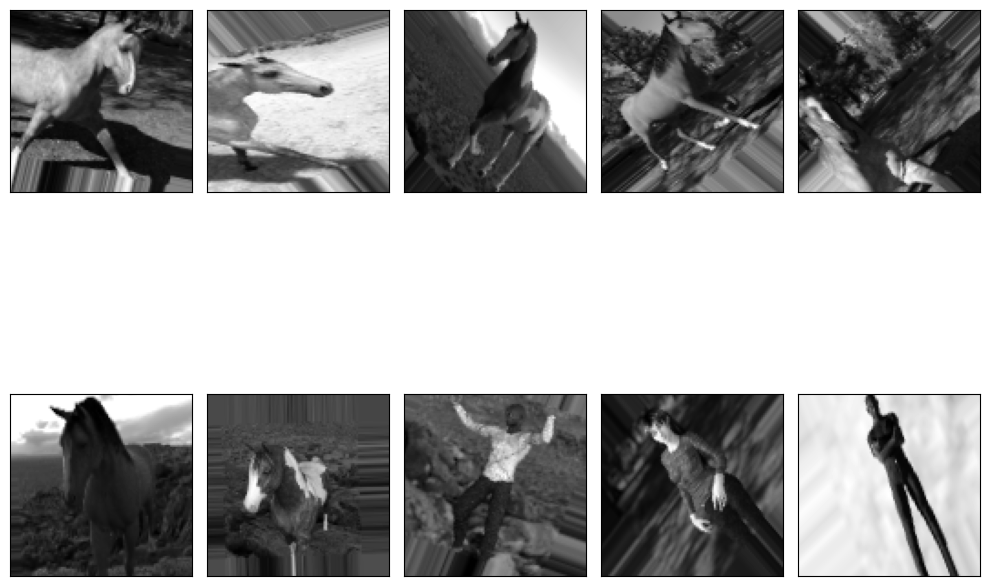

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=50,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=[0.7,1.4]
)

datagen.fit(x)
plt.figure(figsize=(10,10))
#Ya nos devuelve un batch de 10, asi que no hace falta iterar
for (foto, etq) in datagen.flow(x,y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(foto[i].reshape(100,100), cmap='gray')

  plt.tight_layout()
  plt.show()
  break


In [ ]:
from tensorflow.keras.initializers import HeNormal
modeloAD = tf.keras.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer=HeNormal(),input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.8),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])
modeloAD.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

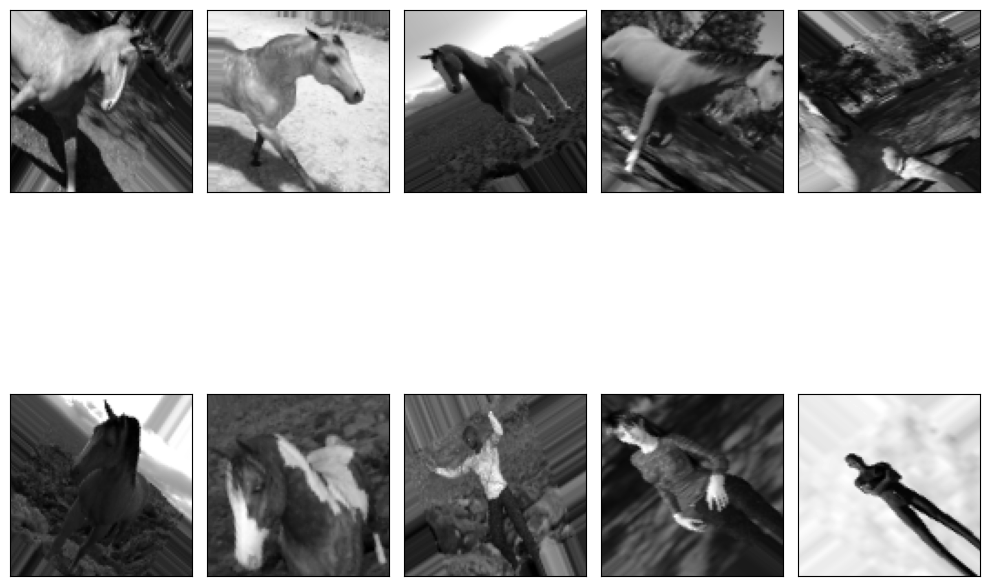

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=50,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=[0.7,1.4]
)

datagen.fit(x)
plt.figure(figsize=(10,10))
#Ya nos devuelve un batch de 10, asi que no hace falta iterar
for (foto, etq) in datagen.flow(x,y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2,5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(foto[i].reshape(100,100), cmap='gray')

  plt.tight_layout()
  plt.show()
  break


In [ ]:
from tensorflow.keras.initializers import HeNormal
modeloAD = tf.keras.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', kernel_initializer=HeNormal(),input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3),activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.8),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])
modeloAD.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [ ]:
len(x) * .85
len(x) - 873 #

x_train = x[:600]
x_test = x[601:]

y_train = y[:600]
y_test = y[601:]


In [ ]:
#Nos devuelve los pares(x,y) del entrenamiento con modificaciones
data_gen_entrenamiento = datagen.flow(x_train,y_train, batch_size=32)
from tensorflow.keras.callbacks import TensorBoard
tensorboardAD = TensorBoard(log_dir='logs/AD')
modeloAD.fit(
    data_gen_entrenamiento,
    batch_size=32,
    validation_data=(x_train,y_train),
    epochs=15,
    steps_per_epoch=int(np.ceil(len(x_train) / float(32))),
    validation_steps=int(np.ceil(len(x_test) / float(32))),
    callbacks=[tensorboardAD])

Epoch 1/15
19/19 [==============================] - 15s 711ms/step - loss: 0.8233 - accuracy: 0.5100 - val_loss: 0.6794 - val_accuracy: 0.5246
Epoch 2/15
19/19 [==============================] - 13s 721ms/step - loss: 0.6790 - accuracy: 0.5617 - val_loss: 0.5785 - val_accuracy: 0.8594
Epoch 3/15
19/19 [==============================] - 13s 664ms/step - loss: 0.6001 - accuracy: 0.6867 - val_loss: 0.3243 - val_accuracy: 0.8839
Epoch 4/15
19/19 [==============================] - 12s 636ms/step - loss: 0.5127 - accuracy: 0.7550 - val_loss: 0.2639 - val_accuracy: 0.9174
Epoch 5/15
19/19 [==============================] - 12s 642ms/step - loss: 0.5112 - accuracy: 0.7733 - val_loss: 0.2602 - val_accuracy: 0.9219
Epoch 6/15
19/19 [==============================] - 13s 679ms/step - loss: 0.4704 - accuracy: 0.7717 - val_loss: 0.2795 - val_accuracy: 0.8594
Epoch 7/15
19/19 [==============================] - 12s 639ms/step - loss: 0.4644 - accuracy: 0.8017 - val_loss: 0.2636 - val_accuracy: 0.9219

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
from tensorflow.keras.preprocessing import image
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(100, 100), color_mode='grayscale')
    img_array = image.img_to_array(img)
    img_array = img_array / 255.0  # Normalizar la imagen
    img_array = np.expand_dims(img_array, axis=0)  # Añadir una dimensión para el batch
    return img_array


image_path = '/content/person5.jpg'


foto = preprocess_image(image_path)

# Realizar la predicción
prediction = modeloAD.predict(foto)

# Mostrar la predicción
print(f'Model prediction: {prediction[0][0]}')
if prediction[0][0] < 0.5:
    print('Predicted class: Caballo')
else:
    print('Predicted class: Humano')

1/1 [==============================] - 0s 35ms/step
Model prediction: 0.861483097076416
Predicted class: Humano
